In [ ]:
!pip install shap
!pip install lightgbm
!pip install xgboost
!pip install imblearn
!pip install category_encoders
!pip install pytorch_tabnet

In [ ]:
!pip install optuna

In [ ]:
!pip install catboost

In [ ]:
import pandas as pd
import numpy as np
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score, f1_score, mean_absolute_error, mean_squared_error
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler, MinMaxScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from imblearn.combine import SMOTEENN
from sklearn.linear_model import LogisticRegression
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
import optuna
import shap
from catboost import CatBoostClassifier
from pytorch_tabnet.tab_model import TabNetClassifier
from xgboost import XGBClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.tree import DecisionTreeClassifier
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize

In [ ]:
data = pd.read_csv('/data_transformed.csv')

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155116 entries, 0 to 155115
Data columns (total 24 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   outcome_type          154435 non-null  object 
 1   animal_type           154469 non-null  object 
 2   color                 154469 non-null  object 
 3   found_location        149028 non-null  object 
 4   intake_type           149028 non-null  object 
 5   intake_condition      149028 non-null  object 
 6   sex_upon_intake       149026 non-null  object 
 7   age_upon_intake       149027 non-null  object 
 8   age_days_outcome      154456 non-null  float64
 9   age_days_intake       149021 non-null  float64
 10  day_of_birth          154469 non-null  float64
 11  month_of_birth        154469 non-null  float64
 12  year_of_birth         154469 non-null  float64
 13  day_intake            149028 non-null  float64
 14  month_intake          149028 non-null  float64
 15  

In [ ]:
data.isnull().sum()

,0
outcome_type,681
animal_type,647
color,647
found_location,6088
intake_type,6088
intake_condition,6088
sex_upon_intake,6090
age_upon_intake,6089
age_days_outcome,660
age_days_intake,6095


#Simple Imputer for numerical columns

In [ ]:
numeric_features = data.select_dtypes(include=['int64', 'float64']).columns

simple_imputer = Pipeline([
    ('imputer', SimpleImputer(strategy='median'))
])

data[numeric_features] = simple_imputer.fit_transform(data[numeric_features])

In [ ]:
# Identify numerical and categorical columns
num_cols = ['age_days_outcome','age_days_intake','day_of_birth','month_of_birth','year_of_birth','outcome_event_year','outcome_event_season','intake_season','has_name','is_fixed_inatke', 'is_fixed_outcome','Outcome_is_weekend','is_Pure_breed']
cat_cols = ['animal_type','intake_type','intake_condition','outcome_event_season','intake_season']

# Find columns with missing values
missing_num_cols = [col for col in num_cols if data[col].isnull().sum() > 0]
missing_cat_cols = [col for col in cat_cols if data[col].isnull().sum() > 0]

##Model based imputation for numeric columns ---> Regression imputation

In [ ]:
for col in missing_num_cols:
    print(f"Imputing missing values in {col}...")

    # Create dataset where this column is missing
    temp_df = data.dropna(subset=[col])  # Drop rows where col is missing for training
    test_df = data[data[col].isnull()]   # Select rows where col is missing for prediction

    # Prepare X (features) and y (target)
    X = temp_df.drop(columns=[col])  # Drop target column
    y = temp_df[col]  # Target is the missing column

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)
    test_X = pd.get_dummies(test_df.drop(columns=[col]), drop_first=True)

    # Align columns (ensure train and test have the same feature set)
    test_X = test_X.reindex(columns=X.columns, fill_value=0)

    # Train a model (Random Forest Regressor)
    model = RandomForestRegressor(n_estimators=100, random_state=42)
    model.fit(X, y)

    # Predict missing values
    data.loc[data[col].isnull(), col] = model.predict(test_X)

##Model-Based Imputation for Categorical Columns (Classification)

from sklearn.preprocessing import LabelEncoder
for col in missing_cat_cols:
    print(f"Imputing missing values in {col}...")
    label_encoder = LabelEncoder()
    temp_df = data.dropna(subset=[col])
    temp_df[col] = label_encoder.fit_transform(temp_df[col])

    test_df = data[data[col].isnull()]  # missing rows
    X = temp_df.drop(columns=[col])  
    y = temp_df[col]  

    # Encode categorical variables
    X = pd.get_dummies(X, drop_first=True)
    test_X = pd.get_dummies(test_df.drop(columns=[col]), drop_first=True)

    # ensure train and test have the same feature set
    test_X = test_X.reindex(columns=X.columns, fill_value=0)
    model = RandomForestClassifier(n_estimators=100, random_state=42)
    model.fit(X, y)
    predicted_values = model.predict(test_X)
    data.loc[data[col].isnull(), col] = label_encoder.inverse_transform(predicted_values)

Imputing missing values in outcome_type...


<ipython-input-14-95c50fd422e5>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df[col] = label_encoder.fit_transform(temp_df[col])


Imputing missing values in animal_type...


<ipython-input-14-95c50fd422e5>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df[col] = label_encoder.fit_transform(temp_df[col])


Imputing missing values in color...


<ipython-input-14-95c50fd422e5>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  temp_df[col] = label_encoder.fit_transform(temp_df[col])


In [ ]:
data = data.drop(columns=['age_upon_intake','found_location','sex_upon_intake'])

In [ ]:
data.isnull().sum()

,0
outcome_type,681
animal_type,647
color,647
intake_type,6088
intake_condition,6088
age_days_outcome,0
age_days_intake,0
day_of_birth,0
month_of_birth,0
year_of_birth,0


In [ ]:
categorical_imputer = SimpleImputer(strategy='most_frequent')

# Apply the imputer to the specified categorical columns
categorical_cols = ['outcome_type', 'animal_type', 'color', 'intake_type', 'intake_condition']
data[categorical_cols] = categorical_imputer.fit_transform(data[categorical_cols])
print(data.isnull().sum())

outcome_type            0
animal_type             0
color                   0
intake_type             0
intake_condition        0
age_days_outcome        0
age_days_intake         0
day_of_birth            0
month_of_birth          0
year_of_birth           0
day_intake              0
month_intake            0
year_intake             0
outcome_event_season    0
intake_season           0
has_name                0
is_fixed_inatke         0
is_fixed_outcome        0
Outcome_is_weekend      0
is_Pure_breed           0
outcome_event_year      0
dtype: int64


In [ ]:
data_transformed_final = data.copy()
data_transformed_final.to_csv('data_transformed_final.csv', index=False)

In [ ]:
data_endcodedf = data.copy()

In [ ]:
data['animal_type'].value_counts()

,count
animal_type,
Dog,79960
Cat,65469
Other,8785
Bird,868
Livestock,34


In [ ]:
data['intake_type'].value_counts()

,count
intake_type,
Stray,110974
Owner Surrender,27791
Public Assist,8310
Wildlife,6122
Abandoned,1677
Euthanasia Request,242


In [ ]:
data_endcodedf['intake_condition'].value_counts()

,count
intake_condition,
Normal,131081
Injured,9660
Sick,7197
Nursing,3704
Neonatal,1712
Medical,500
Aged,459
Other,327
Pregnant,139


In [ ]:
medical_conditions = ["Neonatal", "Nursing", "Medical", "Med Attn", "Neurologic"]
other_conditions = ["Other", "Unknown", "Med Urgent", "Behavior", "Parvo", "Agonal", "Space", "Panleuk", "Congenital"]
data_endcodedf['intake_condition'] = data_endcodedf['intake_condition'].replace({
    **{cond: "Medical" for cond in medical_conditions},   # Merge medical conditions
    **{cond: "Others" for cond in other_conditions},      # Merge all other minor categories into "Others"
})

# Keep only the final categories
final_categories = ["Normal", "Sick", "Injured", "Medical", "Aged", "Feral", "Pregnant", "Others"]
data_endcodedf['intake_condition'] = pd.Categorical(data_endcodedf['intake_condition'], categories=final_categories)

In [ ]:
data_endcodedf['intake_condition'].value_counts()

,count
intake_condition,
Normal,131081
Injured,9660
Sick,7197
Medical,5996
Aged,459
Others,449
Pregnant,139
Feral,135


In [ ]:
data['outcome_event_season'].value_counts()

,count
outcome_event_season,
Summer,44510
Fall,39809
Spring,35264
Winter,34886
Unknown,647


In [ ]:
data['intake_season'].value_counts()

,count
intake_season,
Summer,41165
Spring,38832
Fall,37885
Winter,31146
Unknown,6088


In [ ]:
label_encoders = {}
for col in ['animal_type', 'intake_type', 'intake_condition', 'outcome_event_season', 'intake_season','outcome_type']:
    le = LabelEncoder()
    data_endcodedf[col] = le.fit_transform(data_endcodedf[col])  # Apply encoding
    label_encoders[col] = le  # Store encoder for future inverse transformation
print(data_endcodedf[['animal_type', 'intake_type', 'intake_condition', 'outcome_event_season', 'intake_season', 'outcome_type']].head())

   animal_type  intake_type  intake_condition  outcome_event_season  \
0            2            3                 4                     4   
1            2            2                 4                     1   
2            2            3                 2                     0   
3            2            4                 0                     0   
4            2            4                 4                     0   

   intake_season  outcome_type  
0              4             7  
1              1            10  
2              0             7  
3              0             7  
4              0             7  


In [ ]:
cate_features = data_endcodedf[['animal_type','intake_type','intake_condition','outcome_event_season','intake_season']]
nume_features = data_endcodedf[['age_days_outcome','age_days_intake','day_of_birth','month_of_birth','year_of_birth','outcome_event_year','outcome_event_season','intake_season','has_name','is_fixed_inatke', 'is_fixed_outcome','Outcome_is_weekend','is_Pure_breed']]

In [ ]:
data_endcodedf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 155116 entries, 0 to 155115
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   outcome_type          155116 non-null  int64  
 1   animal_type           155116 non-null  int64  
 2   color                 155116 non-null  object 
 3   intake_type           155116 non-null  int64  
 4   intake_condition      155116 non-null  int64  
 5   age_days_outcome      155116 non-null  float64
 6   age_days_intake       155116 non-null  float64
 7   day_of_birth          155116 non-null  float64
 8   month_of_birth        155116 non-null  float64
 9   year_of_birth         155116 non-null  float64
 10  day_intake            155116 non-null  float64
 11  month_intake          155116 non-null  float64
 12  year_intake           155116 non-null  float64
 13  outcome_event_season  155116 non-null  int64  
 14  intake_season         155116 non-null  int64  
 15  

In [ ]:
X = pd.concat([cate_features, nume_features], axis=1)
y = data_endcodedf['outcome_type']

In [ ]:
# SMOTEENN (for mixed categorical & numerical data)
from imblearn.over_sampling import SMOTE
smoteenn = SMOTEENN(sampling_strategy='auto', random_state=42, smote=SMOTE(k_neighbors=1))
X_resampled, y_resampled = smoteenn.fit_resample(X, y)

# Convert to DataFrame
data_balanced = pd.DataFrame(X_resampled, columns=X.columns)
data_balanced['outcome_type'] = y_resampled  # Add target column back

print(data_balanced['outcome_type'].value_counts())

# ==========================
# 🚀 Model Training & Hyperparameter Tuning
# ==========================

In [ ]:
X = pd.concat([cate_features, nume_features], axis=1)
y = data_endcodedf['outcome_type']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


In [ ]:
def tune_rf(trial):
    params = {
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'max_depth': trial.suggest_int('max_depth', 3, 20),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 10),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 5)
    }
    rf_model = RandomForestClassifier(**params, random_state=42)
    rf_model.fit(X_train, y_train)
    preds = rf_model.predict(X_test)
    return accuracy_score(y_test, preds)

study_rf = optuna.create_study(direction='maximize')
study_rf.optimize(tune_rf, n_trials=50)
best_rf_params = study_rf.best_params
print("Best Random Forest Hyperparameters:", best_rf_params)

[I 2025-02-27 23:16:02,474] A new study created in memory with name: no-name-ecb0c5d3-1c8a-4db4-94d8-6349371c549c
[I 2025-02-27 23:16:57,977] Trial 0 finished with value: 0.7826199071686436 and parameters: {'n_estimators': 427, 'max_depth': 18, 'min_samples_split': 6, 'min_samples_leaf': 5}. Best is trial 0 with value: 0.7826199071686436.
[I 2025-02-27 23:17:06,709] Trial 1 finished with value: 0.725373904074265 and parameters: {'n_estimators': 172, 'max_depth': 5, 'min_samples_split': 7, 'min_samples_leaf': 3}. Best is trial 0 with value: 0.7826199071686436.
[I 2025-02-27 23:17:46,213] Trial 2 finished with value: 0.7838125322331099 and parameters: {'n_estimators': 330, 'max_depth': 17, 'min_samples_split': 3, 'min_samples_leaf': 3}. Best is trial 2 with value: 0.7838125322331099.
[I 2025-02-27 23:18:16,181] Trial 3 finished with value: 0.77720474471377 and parameters: {'n_estimators': 289, 'max_depth': 13, 'min_samples_split': 4, 'min_samples_leaf': 4}. Best is trial 2 with value: 0.

Best Random Forest Hyperparameters: {'n_estimators': 267, 'max_depth': 20, 'min_samples_split': 3, 'min_samples_leaf': 1}


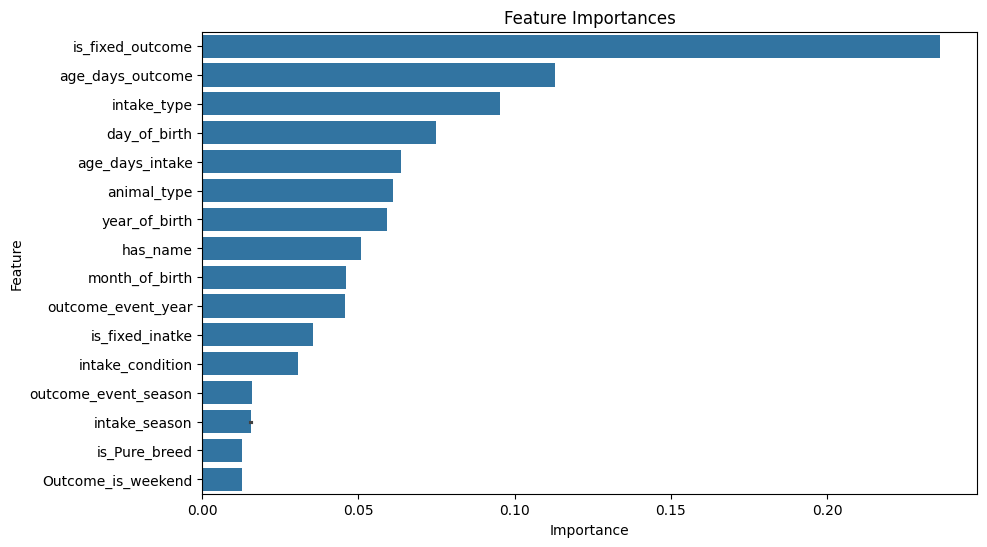

In [ ]:
rf_model = RandomForestClassifier(**best_rf_params, random_state=42)
rf_model.fit(X_train, y_train)
feature_importances = rf_model.feature_importances_
importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})
importances_df = importances_df.sort_values(by='Importance', ascending=False)

#feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importances_df)
plt.title('Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()


In [ ]:
def tune_mlp(trial):
    params = {
        'hidden_layer_sizes': (trial.suggest_int('hidden_layer_1', 50, 200),
                               trial.suggest_int('hidden_layer_2', 50, 200)),  # Two-layer MLP
        'activation': trial.suggest_categorical('activation', ['relu', 'tanh']),
        'solver': trial.suggest_categorical('solver', ['adam', 'sgd']),
        'alpha': trial.suggest_float('alpha', 1e-5, 1e-1, log=True),
        'learning_rate': trial.suggest_categorical('learning_rate', ['constant', 'adaptive']),
        'max_iter': trial.suggest_int('max_iter', 200, 1000, step=100)
    }
    model = MLPClassifier(**params, random_state=42)
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    return accuracy_score(y_test, preds)

study_mlp = optuna.create_study(direction='maximize')
study_mlp.optimize(tune_mlp, n_trials=5)
best_mlp_params = study_mlp.best_params
print("Best MLP Hyperparameters:", best_mlp_params)

[I 2025-02-28 00:00:17,928] A new study created in memory with name: no-name-dc9e21b2-ac62-470d-a75a-19f10afc4cf2
[I 2025-02-28 00:03:19,226] Trial 0 finished with value: 0.7460675605982465 and parameters: {'hidden_layer_1': 102, 'hidden_layer_2': 167, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.03003115722101281, 'learning_rate': 'adaptive', 'max_iter': 900}. Best is trial 0 with value: 0.7460675605982465.
[I 2025-02-28 00:04:16,202] Trial 1 finished with value: 0.4834966477565756 and parameters: {'hidden_layer_1': 65, 'hidden_layer_2': 175, 'activation': 'tanh', 'solver': 'adam', 'alpha': 8.010596926275103e-05, 'learning_rate': 'constant', 'max_iter': 200}. Best is trial 0 with value: 0.7460675605982465.
[I 2025-02-28 00:04:33,859] Trial 2 finished with value: 0.4832710159876225 and parameters: {'hidden_layer_1': 123, 'hidden_layer_2': 199, 'activation': 'relu', 'solver': 'sgd', 'alpha': 0.006851872207936893, 'learning_rate': 'constant', 'max_iter': 800}. Best is trial 0 with 

Best MLP Hyperparameters: {'hidden_layer_1': 102, 'hidden_layer_2': 167, 'activation': 'relu', 'solver': 'adam', 'alpha': 0.03003115722101281, 'learning_rate': 'adaptive', 'max_iter': 900}


In [ ]:
cate_features1 = data_endcodedf[['animal_type','intake_type','intake_condition','outcome_event_season','intake_season']]
nume_features1 = data_endcodedf[['age_days_outcome','age_days_intake','day_of_birth','month_of_birth','year_of_birth','outcome_event_year','has_name','is_fixed_inatke', 'is_fixed_outcome','Outcome_is_weekend','is_Pure_breed']]

X1 = pd.concat([cate_features1, nume_features1], axis=1)
y1 = data_endcodedf['outcome_type']
X_train, X_test, y_train, y_test = train_test_split(X1, y1, test_size=0.2, random_state=42)


def tune_xgb(trial):
    params = {
        'learning_rate': trial.suggest_float('learning_rate', 0.005, 0.5),
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000),
        'max_depth': trial.suggest_int('max_depth', 3, 15),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_float('gamma', 0.0, 5.0),
        'subsample': trial.suggest_float('subsample', 0.5, 1.0)
    }
    model = XGBClassifier(**params, use_label_encoder=False, random_state=42)
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    return accuracy_score(y_test, preds)

study_xgb = optuna.create_study(direction='maximize')
study_xgb.optimize(tune_xgb, n_trials=30)
best_xgb_params = study_xgb.best_params
print("Best XGBoost Hyperparameters:", best_xgb_params)

[I 2025-02-28 00:29:49,987] A new study created in memory with name: no-name-4ce5820d-8e73-479c-96f0-9a60a4a9c41f
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [00:29:50] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
[I 2025-02-28 00:30:05,315] Trial 0 finished with value: 0.7756253223310985 and parameters: {'learning_rate': 0.38620704237793274, 'n_estimators': 289, 'max_depth': 5, 'min_child_weight': 7, 'gamma': 4.575121616141212, 'subsample': 0.8236308401940202}. Best is trial 0 with value: 0.7756253223310985.
/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [00:30:05] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)
[I 2025-02-28 00:30:32,878] Trial 1 finished with value: 0.7812338834450748 and parameters: {'learning_rate': 0.1762772594477199, 'n_estimators': 499, 'max_depth

Best XGBoost Hyperparameters: {'learning_rate': 0.04118185562418018, 'n_estimators': 884, 'max_depth': 14, 'min_child_weight': 4, 'gamma': 0.38790308715335997, 'subsample': 0.869369943799406}


In [ ]:
import plotly.express as px
# Changed XBGClassifier to XGBClassifier
xgb_model = XGBClassifier(**best_xgb_params, use_label_encoder=False, random_state=42)
xgb_model.fit(X_train, y_train)
# Changed feature_importances to use the xgb model
feature_importances = xgb_model.feature_importances_
importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})
importances_df = importances_df.sort_values(by='Importance', ascending=False)
# Create the Plotly bar chart
fig = px.bar(importances_df, x='Importance', y='Feature', orientation='h',
             title='XGBoost Feature Importance', labels={'Importance': 'Importance Score', 'Feature': 'Feature Name'})
fig.show()

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning: [00:58:08] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.

  warnings.warn(smsg, UserWarning)


In [ ]:
def tune_lgbm(trial):
    params = {
        'objective': 'multiclass',
        'metric': 'multi_logloss',
        'num_class': len(np.unique(y_train)),  # Number of classes in your target variable
        'boosting_type': trial.suggest_categorical('boosting_type', ['gbdt', 'dart', 'goss']),
        'num_leaves': trial.suggest_int('num_leaves', 20, 1000),
        'learning_rate': trial.suggest_float('learning_rate', 0.001, 0.5),
        'feature_fraction': trial.suggest_float('feature_fraction', 0.4, 1.0),
        'bagging_fraction': trial.suggest_float('bagging_fraction', 0.4, 1.0),
        'bagging_freq': trial.suggest_int('bagging_freq', 1, 7),
        'min_child_samples': trial.suggest_int('min_child_samples', 5, 100),
    }
    #Set bagging_freq to 0 if boosting type is goss to disable bagging.
    if params['boosting_type'] == 'goss':
        params['bagging_freq'] = 0
        params['bagging_fraction'] = 1.0
    model = LGBMClassifier(**params, random_state=42, n_estimators=100) #Added n_estimators
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    return accuracy_score(y_test, preds)

study_lgbm = optuna.create_study(direction='maximize')
study_lgbm.optimize(tune_lgbm, n_trials=30) #Reduced n_trials for faster execution
best_lgbm_params = study_lgbm.best_params
print("Best LightGBM Hyperparameters:", best_lgbm_params)

[I 2025-02-28 01:34:07,135] A new study created in memory with name: no-name-fdae3c6a-ea7c-4d6a-a3b8-2f6c53200728


[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9676279171979587, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9676279171979587
[LightGBM] [Warning] bagging_fraction is set=0.4033498052876915, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4033498052876915
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9676279171979587, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9676279171979587
[LightGBM] [Warning] bagging_fraction is set=0.4033498052876915, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4033498052876915
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011014 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 01:36:57,876] Trial 0 finished with value: 0.7824587416193914 and parameters: {'boosting_type': 'dart', 'num_leaves': 733, 'learning_rate': 0.10390416207254001, 'feature_fraction': 0.9676279171979587, 'bagging_fraction': 0.4033498052876915, 'bagging_freq': 7, 'min_child_samples': 52}. Best is trial 0 with value: 0.7824587416193914.


[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9950391151561815, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9950391151561815
[LightGBM] [Warning] bagging_fraction is set=0.48445121360236937, subsample=1.0 will be ignored. Current value: bagging_fraction=0.48445121360236937
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.9950391151561815, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9950391151561815
[LightGBM] [Warning] bagging_fraction is set=0.48445121360236937, subsample=1.0 will be ignored. Current value: bagging_fraction=0.48445121360236937
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.011344 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is

[I 2025-02-28 01:37:09,170] Trial 1 finished with value: 0.34873001547189275 and parameters: {'boosting_type': 'gbdt', 'num_leaves': 221, 'learning_rate': 0.33484800758580774, 'feature_fraction': 0.9950391151561815, 'bagging_fraction': 0.48445121360236937, 'bagging_freq': 2, 'min_child_samples': 8}. Best is trial 0 with value: 0.7824587416193914.


[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8311396323279177, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8311396323279177
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8311396323279177, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8311396323279177
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found bo

[I 2025-02-28 01:37:22,482] Trial 2 finished with value: 0.5918643630737493 and parameters: {'boosting_type': 'goss', 'num_leaves': 334, 'learning_rate': 0.39454544027517946, 'feature_fraction': 0.8311396323279177, 'bagging_fraction': 0.4143144699881402, 'bagging_freq': 7, 'min_child_samples': 29}. Best is trial 0 with value: 0.7824587416193914.


[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9091103689329496, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9091103689329496
[LightGBM] [Warning] bagging_fraction is set=0.7120736180420724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7120736180420724
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.9091103689329496, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9091103689329496
[LightGBM] [Warning] bagging_fraction is set=0.7120736180420724, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7120736180420724
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010956 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 01:38:22,222] Trial 3 finished with value: 0.17853919546157812 and parameters: {'boosting_type': 'dart', 'num_leaves': 648, 'learning_rate': 0.42913534368182255, 'feature_fraction': 0.9091103689329496, 'bagging_fraction': 0.7120736180420724, 'bagging_freq': 7, 'min_child_samples': 60}. Best is trial 0 with value: 0.7824587416193914.


[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6056047413950848, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6056047413950848
[LightGBM] [Warning] bagging_fraction is set=0.9306631579253023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9306631579253023
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.6056047413950848, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6056047413950848
[LightGBM] [Warning] bagging_fraction is set=0.9306631579253023, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9306631579253023
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.012938 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 01:39:24,066] Trial 4 finished with value: 0.7320139247034554 and parameters: {'boosting_type': 'gbdt', 'num_leaves': 949, 'learning_rate': 0.15497002639199622, 'feature_fraction': 0.6056047413950848, 'bagging_fraction': 0.9306631579253023, 'bagging_freq': 6, 'min_child_samples': 53}. Best is trial 0 with value: 0.7824587416193914.


[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5073214775499305, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5073214775499305
[LightGBM] [Warning] bagging_fraction is set=0.7007264098196244, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7007264098196244
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.5073214775499305, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5073214775499305
[LightGBM] [Warning] bagging_fraction is set=0.7007264098196244, subsample=1.0 will be ignored. Current value: bagging_fraction=0.7007264098196244
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009273 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 01:39:42,889] Trial 5 finished with value: 0.7607658586900464 and parameters: {'boosting_type': 'gbdt', 'num_leaves': 29, 'learning_rate': 0.011142334337588523, 'feature_fraction': 0.5073214775499305, 'bagging_fraction': 0.7007264098196244, 'bagging_freq': 2, 'min_child_samples': 80}. Best is trial 0 with value: 0.7824587416193914.


[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6901743299863119, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6901743299863119
[LightGBM] [Warning] bagging_fraction is set=0.8051255264774204, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8051255264774204
[LightGBM] [Warning] bagging_freq is set=7, subsample_freq=0 will be ignored. Current value: bagging_freq=7
[LightGBM] [Warning] feature_fraction is set=0.6901743299863119, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6901743299863119
[LightGBM] [Warning] bagging_fraction is set=0.8051255264774204, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8051255264774204
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022644 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] To

[I 2025-02-28 01:40:35,328] Trial 6 finished with value: 0.05805183084063951 and parameters: {'boosting_type': 'dart', 'num_leaves': 781, 'learning_rate': 0.4173003738988629, 'feature_fraction': 0.6901743299863119, 'bagging_fraction': 0.8051255264774204, 'bagging_freq': 7, 'min_child_samples': 23}. Best is trial 0 with value: 0.7824587416193914.


[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6756197363049907, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6756197363049907
[LightGBM] [Warning] bagging_fraction is set=0.8024536420319792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8024536420319792
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.6756197363049907, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6756197363049907
[LightGBM] [Warning] bagging_fraction is set=0.8024536420319792, subsample=1.0 will be ignored. Current value: bagging_fraction=0.8024536420319792
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022938 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] To

[I 2025-02-28 01:42:30,813] Trial 7 finished with value: 0.7177991232594121 and parameters: {'boosting_type': 'dart', 'num_leaves': 600, 'learning_rate': 0.30944413883792865, 'feature_fraction': 0.6756197363049907, 'bagging_fraction': 0.8024536420319792, 'bagging_freq': 4, 'min_child_samples': 53}. Best is trial 0 with value: 0.7824587416193914.


[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5027191695164032, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5027191695164032
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.5027191695164032, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5027191695164032
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found bo

[I 2025-02-28 01:43:03,823] Trial 8 finished with value: 0.6948169159360496 and parameters: {'boosting_type': 'goss', 'num_leaves': 458, 'learning_rate': 0.11966382365860309, 'feature_fraction': 0.5027191695164032, 'bagging_fraction': 0.4120360041854924, 'bagging_freq': 5, 'min_child_samples': 16}. Best is trial 0 with value: 0.7824587416193914.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5897732075597331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5897732075597331
[LightGBM] [Warning] bagging_fraction is set=0.5753578003370079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5753578003370079
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.5897732075597331, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.5897732075597331
[LightGBM] [Warning] bagging_fraction is set=0.5753578003370079, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5753578003370079
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009436 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 01:43:36,113] Trial 9 finished with value: 0.6106240330067045 and parameters: {'boosting_type': 'gbdt', 'num_leaves': 871, 'learning_rate': 0.2842884561336492, 'feature_fraction': 0.5897732075597331, 'bagging_fraction': 0.5753578003370079, 'bagging_freq': 1, 'min_child_samples': 83}. Best is trial 0 with value: 0.7824587416193914.


[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.8150616828612568, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8150616828612568
[LightGBM] [Warning] bagging_fraction is set=0.5705112157459167, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5705112157459167
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.8150616828612568, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8150616828612568
[LightGBM] [Warning] bagging_fraction is set=0.5705112157459167, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5705112157459167
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010593 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 01:46:12,533] Trial 10 finished with value: 0.7846183599793708 and parameters: {'boosting_type': 'dart', 'num_leaves': 731, 'learning_rate': 0.1426248900919066, 'feature_fraction': 0.8150616828612568, 'bagging_fraction': 0.5705112157459167, 'bagging_freq': 4, 'min_child_samples': 94}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.8273924069245946, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8273924069245946
[LightGBM] [Warning] bagging_fraction is set=0.5639889500701323, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5639889500701323
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.8273924069245946, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8273924069245946
[LightGBM] [Warning] bagging_fraction is set=0.5639889500701323, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5639889500701323
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010719 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 01:48:47,397] Trial 11 finished with value: 0.7806214543579164 and parameters: {'boosting_type': 'dart', 'num_leaves': 738, 'learning_rate': 0.16058902280730497, 'feature_fraction': 0.8273924069245946, 'bagging_fraction': 0.5639889500701323, 'bagging_freq': 4, 'min_child_samples': 97}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8173805335756099, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8173805335756099
[LightGBM] [Warning] bagging_fraction is set=0.5626435830195731, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5626435830195731
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8173805335756099, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8173805335756099
[LightGBM] [Warning] bagging_fraction is set=0.5626435830195731, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5626435830195731
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 01:50:57,465] Trial 12 finished with value: 0.7828133058277462 and parameters: {'boosting_type': 'dart', 'num_leaves': 498, 'learning_rate': 0.05158872433208046, 'feature_fraction': 0.8173805335756099, 'bagging_fraction': 0.5626435830195731, 'bagging_freq': 5, 'min_child_samples': 36}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.7909105726325928, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7909105726325928
[LightGBM] [Warning] bagging_fraction is set=0.5957003970557068, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5957003970557068
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.7909105726325928, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7909105726325928
[LightGBM] [Warning] bagging_fraction is set=0.5957003970557068, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5957003970557068
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010627 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 01:53:01,315] Trial 13 finished with value: 0.7490652398143373 and parameters: {'boosting_type': 'dart', 'num_leaves': 461, 'learning_rate': 0.005272188725899601, 'feature_fraction': 0.7909105726325928, 'bagging_fraction': 0.5957003970557068, 'bagging_freq': 5, 'min_child_samples': 38}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7638451225977543, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7638451225977543
[LightGBM] [Warning] bagging_fraction is set=0.6247277953193846, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6247277953193846
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7638451225977543, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7638451225977543
[LightGBM] [Warning] bagging_fraction is set=0.6247277953193846, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6247277953193846
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.022503 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] To

[I 2025-02-28 01:55:08,981] Trial 14 finished with value: 0.7524174832387829 and parameters: {'boosting_type': 'dart', 'num_leaves': 533, 'learning_rate': 0.21523462726677178, 'feature_fraction': 0.7638451225977543, 'bagging_fraction': 0.6247277953193846, 'bagging_freq': 3, 'min_child_samples': 73}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.9040213789512312, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9040213789512312
[LightGBM] [Warning] bagging_fraction is set=0.5057400794434623, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5057400794434623
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.9040213789512312, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.9040213789512312
[LightGBM] [Warning] bagging_fraction is set=0.5057400794434623, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5057400794434623
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010859 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 01:57:14,551] Trial 15 finished with value: 0.7802024239298607 and parameters: {'boosting_type': 'dart', 'num_leaves': 312, 'learning_rate': 0.06752651395765613, 'feature_fraction': 0.9040213789512312, 'bagging_fraction': 0.5057400794434623, 'bagging_freq': 5, 'min_child_samples': 100}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7458316546166761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7458316546166761
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.7458316546166761, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7458316546166761
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found bo

[I 2025-02-28 01:57:53,516] Trial 16 finished with value: 0.6799574522949974 and parameters: {'boosting_type': 'goss', 'num_leaves': 988, 'learning_rate': 0.22146631873618527, 'feature_fraction': 0.7458316546166761, 'bagging_fraction': 0.6656945176655862, 'bagging_freq': 3, 'min_child_samples': 37}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8831814240129395, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8831814240129395
[LightGBM] [Warning] bagging_fraction is set=0.5233056728146193, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5233056728146193
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.8831814240129395, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8831814240129395
[LightGBM] [Warning] bagging_fraction is set=0.5233056728146193, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5233056728146193
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 02:00:38,256] Trial 17 finished with value: 0.7829744713769985 and parameters: {'boosting_type': 'dart', 'num_leaves': 666, 'learning_rate': 0.06469404601307915, 'feature_fraction': 0.8831814240129395, 'bagging_fraction': 0.5233056728146193, 'bagging_freq': 6, 'min_child_samples': 66}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.900466102015175, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.900466102015175
[LightGBM] [Warning] bagging_fraction is set=0.5052417229294449, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5052417229294449
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.900466102015175, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.900466102015175
[LightGBM] [Warning] bagging_fraction is set=0.5052417229294449, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5052417229294449
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010901 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not eno

[I 2025-02-28 02:03:21,081] Trial 18 finished with value: 0.7714994842702424 and parameters: {'boosting_type': 'dart', 'num_leaves': 842, 'learning_rate': 0.17203853636732278, 'feature_fraction': 0.900466102015175, 'bagging_fraction': 0.5052417229294449, 'bagging_freq': 6, 'min_child_samples': 69}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8670187521253024, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8670187521253024
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found boosting=goss. For backwards compatibility reasons, LightGBM interprets this as boosting=gbdt, data_sample_strategy=goss.To suppress this warning, set data_sample_strategy=goss instead.
[LightGBM] [Warning] bagging_freq is set=0, subsample_freq=0 will be ignored. Current value: bagging_freq=0
[LightGBM] [Warning] feature_fraction is set=0.8670187521253024, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8670187521253024
[LightGBM] [Warning] bagging_fraction is set=1.0, subsample=1.0 will be ignored. Current value: bagging_fraction=1.0
[LightGBM] [Warning] Found bo

[I 2025-02-28 02:03:59,678] Trial 19 finished with value: 0.7722730789066529 and parameters: {'boosting_type': 'goss', 'num_leaves': 635, 'learning_rate': 0.08153330553626778, 'feature_fraction': 0.8670187521253024, 'bagging_fraction': 0.7774498643455008, 'bagging_freq': 6, 'min_child_samples': 89}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.944141362597175, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.944141362597175
[LightGBM] [Warning] bagging_fraction is set=0.6402476927144307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6402476927144307
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.944141362597175, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.944141362597175
[LightGBM] [Warning] bagging_fraction is set=0.6402476927144307, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6402476927144307
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.016668 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not eno

[I 2025-02-28 02:04:44,348] Trial 20 finished with value: 0.026946879834966478 and parameters: {'boosting_type': 'dart', 'num_leaves': 699, 'learning_rate': 0.4814630598418665, 'feature_fraction': 0.944141362597175, 'bagging_fraction': 0.6402476927144307, 'bagging_freq': 4, 'min_child_samples': 67}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8310022404711181, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8310022404711181
[LightGBM] [Warning] bagging_fraction is set=0.5263119598846732, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5263119598846732
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.8310022404711181, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8310022404711181
[LightGBM] [Warning] bagging_fraction is set=0.5263119598846732, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5263119598846732
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.018374 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 02:07:03,139] Trial 21 finished with value: 0.783748066013409 and parameters: {'boosting_type': 'dart', 'num_leaves': 539, 'learning_rate': 0.05632331462875598, 'feature_fraction': 0.8310022404711181, 'bagging_fraction': 0.5263119598846732, 'bagging_freq': 5, 'min_child_samples': 41}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.7481421784179416, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7481421784179416
[LightGBM] [Warning] bagging_fraction is set=0.4723459986817602, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4723459986817602
[LightGBM] [Warning] bagging_freq is set=6, subsample_freq=0 will be ignored. Current value: bagging_freq=6
[LightGBM] [Warning] feature_fraction is set=0.7481421784179416, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7481421784179416
[LightGBM] [Warning] bagging_fraction is set=0.4723459986817602, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4723459986817602
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010455 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 02:09:24,445] Trial 22 finished with value: 0.7822975760701393 and parameters: {'boosting_type': 'dart', 'num_leaves': 542, 'learning_rate': 0.0495417522007006, 'feature_fraction': 0.7481421784179416, 'bagging_fraction': 0.4723459986817602, 'bagging_freq': 6, 'min_child_samples': 48}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.8545016565483757, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8545016565483757
[LightGBM] [Warning] bagging_fraction is set=0.5421434987247425, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5421434987247425
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.8545016565483757, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8545016565483757
[LightGBM] [Warning] bagging_fraction is set=0.5421434987247425, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5421434987247425
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010846 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 02:11:38,829] Trial 23 finished with value: 0.7843927282104177 and parameters: {'boosting_type': 'dart', 'num_leaves': 388, 'learning_rate': 0.12465284065512909, 'feature_fraction': 0.8545016565483757, 'bagging_fraction': 0.5421434987247425, 'bagging_freq': 4, 'min_child_samples': 90}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7155371275703851, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7155371275703851
[LightGBM] [Warning] bagging_fraction is set=0.4594606575179222, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4594606575179222
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.7155371275703851, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7155371275703851
[LightGBM] [Warning] bagging_fraction is set=0.4594606575179222, subsample=1.0 will be ignored. Current value: bagging_fraction=0.4594606575179222
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.023792 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] To

[I 2025-02-28 02:13:49,170] Trial 24 finished with value: 0.7824909747292419 and parameters: {'boosting_type': 'dart', 'num_leaves': 373, 'learning_rate': 0.1353454900576375, 'feature_fraction': 0.7155371275703851, 'bagging_fraction': 0.4594606575179222, 'bagging_freq': 3, 'min_child_samples': 91}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.4199059115081495, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4199059115081495
[LightGBM] [Warning] bagging_fraction is set=0.9952275072144163, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9952275072144163
[LightGBM] [Warning] bagging_freq is set=4, subsample_freq=0 will be ignored. Current value: bagging_freq=4
[LightGBM] [Warning] feature_fraction is set=0.4199059115081495, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.4199059115081495
[LightGBM] [Warning] bagging_fraction is set=0.9952275072144163, subsample=1.0 will be ignored. Current value: bagging_fraction=0.9952275072144163
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.008902 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 02:15:00,954] Trial 25 finished with value: 0.7836191335740073 and parameters: {'boosting_type': 'dart', 'num_leaves': 83, 'learning_rate': 0.1988639222926849, 'feature_fraction': 0.4199059115081495, 'bagging_fraction': 0.9952275072144163, 'bagging_freq': 4, 'min_child_samples': 78}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8561068831511758, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8561068831511758
[LightGBM] [Warning] bagging_fraction is set=0.5416246728735381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5416246728735381
[LightGBM] [Warning] bagging_freq is set=3, subsample_freq=0 will be ignored. Current value: bagging_freq=3
[LightGBM] [Warning] feature_fraction is set=0.8561068831511758, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.8561068831511758
[LightGBM] [Warning] bagging_fraction is set=0.5416246728735381, subsample=1.0 will be ignored. Current value: bagging_fraction=0.5416246728735381
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010950 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 02:16:29,546] Trial 26 finished with value: 0.5977630221763796 and parameters: {'boosting_type': 'dart', 'num_leaves': 213, 'learning_rate': 0.2650149943038439, 'feature_fraction': 0.8561068831511758, 'bagging_fraction': 0.5416246728735381, 'bagging_freq': 3, 'min_child_samples': 87}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.7961034272627516, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7961034272627516
[LightGBM] [Warning] bagging_fraction is set=0.6162816908822821, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6162816908822821
[LightGBM] [Warning] bagging_freq is set=5, subsample_freq=0 will be ignored. Current value: bagging_freq=5
[LightGBM] [Warning] feature_fraction is set=0.7961034272627516, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.7961034272627516
[LightGBM] [Warning] bagging_fraction is set=0.6162816908822821, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6162816908822821
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.010818 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 02:18:45,558] Trial 27 finished with value: 0.7846183599793708 and parameters: {'boosting_type': 'dart', 'num_leaves': 404, 'learning_rate': 0.10563908750247672, 'feature_fraction': 0.7961034272627516, 'bagging_fraction': 0.6162816908822821, 'bagging_freq': 5, 'min_child_samples': 94}. Best is trial 10 with value: 0.7846183599793708.


[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6408167015140673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408167015140673
[LightGBM] [Warning] bagging_fraction is set=0.613170145160111, subsample=1.0 will be ignored. Current value: bagging_fraction=0.613170145160111
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6408167015140673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408167015140673
[LightGBM] [Warning] bagging_fraction is set=0.613170145160111, subsample=1.0 will be ignored. Current value: bagging_fraction=0.613170145160111
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not eno

[I 2025-02-28 02:19:27,700] Trial 28 finished with value: 0.78529525528623 and parameters: {'boosting_type': 'gbdt', 'num_leaves': 395, 'learning_rate': 0.10239435172939793, 'feature_fraction': 0.6408167015140673, 'bagging_fraction': 0.613170145160111, 'bagging_freq': 2, 'min_child_samples': 96}. Best is trial 28 with value: 0.78529525528623.


[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6505534207000281, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6505534207000281
[LightGBM] [Warning] bagging_fraction is set=0.6589562726646466, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6589562726646466
[LightGBM] [Warning] bagging_freq is set=1, subsample_freq=0 will be ignored. Current value: bagging_freq=1
[LightGBM] [Warning] feature_fraction is set=0.6505534207000281, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6505534207000281
[LightGBM] [Warning] bagging_fraction is set=0.6589562726646466, subsample=1.0 will be ignored. Current value: bagging_fraction=0.6589562726646466
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.009629 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not

[I 2025-02-28 02:19:54,691] Trial 29 finished with value: 0.7118037648272305 and parameters: {'boosting_type': 'gbdt', 'num_leaves': 234, 'learning_rate': 0.1883050290610135, 'feature_fraction': 0.6505534207000281, 'bagging_fraction': 0.6589562726646466, 'bagging_freq': 1, 'min_child_samples': 96}. Best is trial 28 with value: 0.78529525528623.


Best LightGBM Hyperparameters: {'boosting_type': 'gbdt', 'num_leaves': 395, 'learning_rate': 0.10239435172939793, 'feature_fraction': 0.6408167015140673, 'bagging_fraction': 0.613170145160111, 'bagging_freq': 2, 'min_child_samples': 96}


In [ ]:
lgbm_model = LGBMClassifier(**best_lgbm_params, random_state=42, n_estimators=100)
lgbm_model.fit(X_train, y_train)

# Get feature importances
feature_importances = lgbm_model.feature_importances_

# Create a DataFrame for feature importances
importances_df = pd.DataFrame({'Feature': X_train.columns, 'Importance': feature_importances})
importances_df = importances_df.sort_values(by='Importance', ascending=False)

# Create the Plotly bar chart
fig = px.bar(importances_df, x='Importance', y='Feature', orientation='h',
             title='LightGBM Feature Importance', labels={'Importance': 'Importance Score', 'Feature': 'Feature Name'})
fig.show()

[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6408167015140673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408167015140673
[LightGBM] [Warning] bagging_fraction is set=0.613170145160111, subsample=1.0 will be ignored. Current value: bagging_fraction=0.613170145160111
[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6408167015140673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408167015140673
[LightGBM] [Warning] bagging_fraction is set=0.613170145160111, subsample=1.0 will be ignored. Current value: bagging_fraction=0.613170145160111
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.013099 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not eno

In [ ]:
def tune_decision_tree(trial):
    params = {
        'criterion': trial.suggest_categorical('criterion', ['gini', 'entropy']),
        'splitter': trial.suggest_categorical('splitter', ['best', 'random']),
        'max_depth': trial.suggest_int('max_depth', 3, 50),
        'min_samples_split': trial.suggest_int('min_samples_split', 2, 20),
        'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 20)
    }
    model = DecisionTreeClassifier(**params, random_state=42)
    model.fit(X_train, y_train)
    preds = model.predict(X_test)
    return accuracy_score(y_test, preds)

study_dt = optuna.create_study(direction='maximize')
study_dt.optimize(tune_decision_tree, n_trials=30)
best_dt_params = study_dt.best_params
print("Best Decision Tree Hyperparameters:", best_dt_params)

[I 2025-02-28 01:01:31,240] A new study created in memory with name: no-name-1a904dd3-7ccb-4ce6-89ca-f91cbdb4f419
[I 2025-02-28 01:01:31,777] Trial 0 finished with value: 0.7637635379061372 and parameters: {'criterion': 'gini', 'splitter': 'best', 'max_depth': 46, 'min_samples_split': 5, 'min_samples_leaf': 20}. Best is trial 0 with value: 0.7637635379061372.
[I 2025-02-28 01:01:32,350] Trial 1 finished with value: 0.7519339865910263 and parameters: {'criterion': 'gini', 'splitter': 'best', 'max_depth': 37, 'min_samples_split': 13, 'min_samples_leaf': 9}. Best is trial 0 with value: 0.7637635379061372.
[I 2025-02-28 01:01:32,780] Trial 2 finished with value: 0.7676315110881898 and parameters: {'criterion': 'entropy', 'splitter': 'best', 'max_depth': 11, 'min_samples_split': 14, 'min_samples_leaf': 18}. Best is trial 2 with value: 0.7676315110881898.
[I 2025-02-28 01:01:33,359] Trial 3 finished with value: 0.7476792160907685 and parameters: {'criterion': 'gini', 'splitter': 'best', 'max

Best Decision Tree Hyperparameters: {'criterion': 'entropy', 'splitter': 'best', 'max_depth': 11, 'min_samples_split': 14, 'min_samples_leaf': 18}


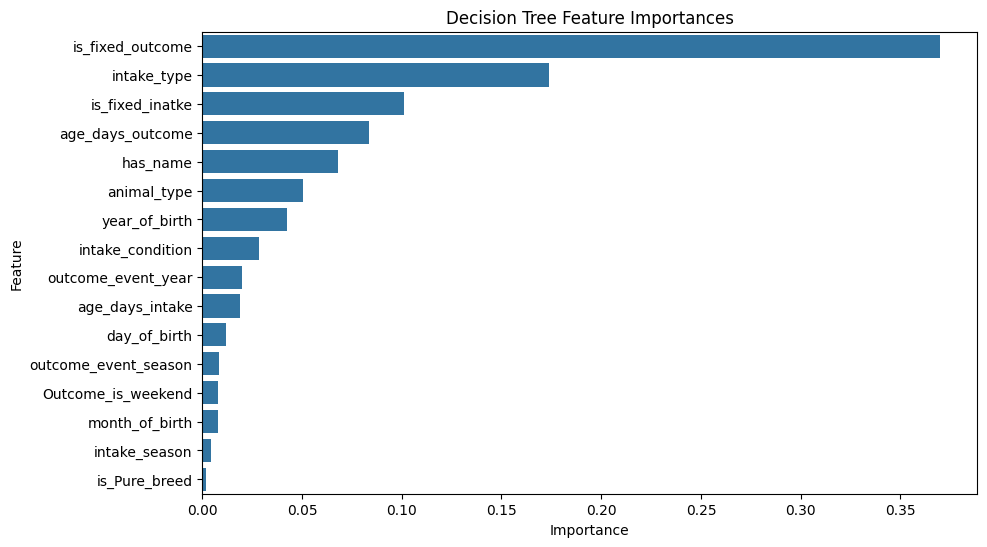

In [ ]:
model = DecisionTreeClassifier(**best_dt_params, random_state=42)
model.fit(X_train, y_train)


importances = model.feature_importances_
feature_names = X_train.columns

# Create a DataFrame for visualization
importance_df = pd.DataFrame({'Feature': feature_names, 'Importance': importances})
importance_df = importance_df.sort_values(by='Importance', ascending=False)

# Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df)
plt.title('Decision Tree Feature Importances')
plt.xlabel('Importance')
plt.ylabel('Feature')
plt.show()

In [ ]:
rf_final = RandomForestClassifier(**best_rf_params, random_state=42).fit(X_train, y_train)
xgb_final = XGBClassifier(**best_xgb_params, use_label_encoder=False, random_state=42).fit(X_train, y_train)
dt_final = DecisionTreeClassifier(**best_dt_params, random_state=42).fit(X_train, y_train)

rf_preds = rf_final.predict(X_test)
xgb_preds = xgb_final.predict(X_test)
dt_preds = dt_final.predict(X_test)

print("RF Accuracy:", accuracy_score(y_test, rf_preds))
print("XGBoost Accuracy:", accuracy_score(y_test, xgb_preds))
print("Decision Tree Accuracy:", accuracy_score(y_test, dt_preds))

/usr/local/lib/python3.11/dist-packages/xgboost/core.py:158: UserWarning:

[01:07:36] WARNING: /workspace/src/learner.cc:740: 
Parameters: { "use_label_encoder" } are not used.




RF Accuracy: 0.7877449716348633
XGBoost Accuracy: 0.7907104177411036
Decision Tree Accuracy: 0.7676315110881898


In [ ]:
y_score = rf_final.predict_proba(X_test)

# Binarize the output
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_bin.shape[1]

#ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

#ROC curve for a specific class
fig = px.line()
for i in range(n_classes):
    fig.add_scatter(x=fpr[i], y=tpr[i], name=f"ROC curve of class {i} (area = {roc_auc[i]:.2f})")

fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_xaxes(title_text="False Positive Rate")
fig.update_yaxes(title_text="True Positive Rate")
fig.update_layout(title_text="ROC Curves for Random Forest Classifier",
                  xaxis_range=[0,1],yaxis_range=[0,1])
fig.show()


In [ ]:
y_score = xgb_final.predict_proba(X_test)

# Binarize the output
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

#ROC curve for a specific class
fig = px.line()
for i in range(n_classes):
    fig.add_scatter(x=fpr[i], y=tpr[i], name=f"ROC curve of class {i} (area = {roc_auc[i]:.2f})")

fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_xaxes(title_text="False Positive Rate")
fig.update_yaxes(title_text="True Positive Rate")
fig.update_layout(title_text="ROC Curves for XGBoost Classifier",
                  xaxis_range=[0,1],yaxis_range=[0,1])
fig.show()


In [ ]:
y_score = lgbm_model.predict_proba(X_test)

# Binarize the output
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_bin.shape[1]

# Compute ROC curve and ROC area for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# ROC curve for each class
fig = px.line()
for i in range(n_classes):
    fig.add_scatter(x=fpr[i], y=tpr[i], name=f"ROC curve of class {i} (area = {roc_auc[i]:.2f})")

fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_xaxes(title_text="False Positive Rate")
fig.update_yaxes(title_text="True Positive Rate")
fig.update_layout(title_text="ROC Curves for LightGBM Classifier",
                  xaxis_range=[0,1],yaxis_range=[0,1])
fig.show()


[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6408167015140673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408167015140673
[LightGBM] [Warning] bagging_fraction is set=0.613170145160111, subsample=1.0 will be ignored. Current value: bagging_fraction=0.613170145160111


In [ ]:
y_score = dt_final.predict_proba(X_test)

# Binarize the output
y_test_bin = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_bin.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
fig = px.line()
for i in range(n_classes):
    fig.add_scatter(x=fpr[i], y=tpr[i], name=f"ROC curve of class {i} (area = {roc_auc[i]:.2f})")

fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_xaxes(title_text="False Positive Rate")
fig.update_yaxes(title_text="True Positive Rate")
fig.update_layout(title_text="ROC Curves for Decision Tree Classifier",
                  xaxis_range=[0,1],yaxis_range=[0,1])
fig.show()


In [ ]:
import plotly.graph_objects as go
from sklearn.metrics import roc_curve, auc, roc_auc_score
# Assuming rf_final, xgb_final, dt_final, and lgbm_model are already defined and trained

models = {
    'Random Forest': rf_final,
    'XGBoost': xgb_final,
    'Decision Tree': dt_final,
    'LightGBM': lgbm_model
}

fig = go.Figure()

# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_binarized.shape[1]

for model_name, model in models.items():
    y_probs = model.predict_proba(X_test)
    for i in range(4):  # Only for classes 0, 1, 2, and 3
        fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_probs[:, i])
        roc_auc = auc(fpr, tpr)
        fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f'{model_name} Class {i} (AUC = {roc_auc:.2f})'))

fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_xaxes(title_text="False Positive Rate")
fig.update_yaxes(title_text="True Positive Rate")
fig.update_layout(title_text="ROC Curves for all Models (Classes 0-3)",
                  xaxis_range=[0,1],yaxis_range=[0,1])
fig.show()


[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6408167015140673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408167015140673
[LightGBM] [Warning] bagging_fraction is set=0.613170145160111, subsample=1.0 will be ignored. Current value: bagging_fraction=0.613170145160111


In [ ]:
outcome_type_mapping = dict(zip(label_encoders['outcome_type'].transform(label_encoders['outcome_type'].classes_), label_encoders['outcome_type'].classes_))

# Print the mapping
print("Mapping of outcome_type classes:")
outcome_type_mapping


Mapping of outcome_type classes:


{0: 'Adoption',
 1: 'Died',
 2: 'Disposal',
 3: 'Euthanasia',
 4: 'Lost',
 5: 'Missing',
 6: 'Relocate',
 7: 'Return to Owner',
 8: 'Rto-Adopt',
 9: 'Stolen',
 10: 'Transfer'}

In [ ]:
models = {
    'Random Forest': rf_final,
    'XGBoost': xgb_final,
    'Decision Tree': dt_final,
    'LightGBM': lgbm_model
}

fig = go.Figure()

# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_binarized.shape[1]

# Class mappings (replace with actual class meanings)
class_mappings = {
    0: "Adoption",
    1: "Died",
    2: "Disposal",
    3: "Euthanasia",
    4: "Lost"
}


for model_name, model in models.items():
    y_probs = model.predict_proba(X_test)
    for i in range(4):  # Only for classes 0, 1, 2, and 3
        fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_probs[:, i])
        roc_auc = auc(fpr, tpr)
        fig.add_trace(go.Scatter(x=fpr, y=tpr, mode='lines', name=f'{model_name} {class_mappings[i]} (AUC = {roc_auc:.2f})'))

fig.add_shape(
    type='line', line=dict(dash='dash'),
    x0=0, x1=1, y0=0, y1=1
)

fig.update_xaxes(title_text="False Positive Rate")
fig.update_yaxes(title_text="True Positive Rate")
fig.update_layout(title_text="ROC Curves for all Models (Classes 0-3)",
                  xaxis_range=[0,1],yaxis_range=[0,1])
fig.show()


[LightGBM] [Warning] bagging_freq is set=2, subsample_freq=0 will be ignored. Current value: bagging_freq=2
[LightGBM] [Warning] feature_fraction is set=0.6408167015140673, colsample_bytree=1.0 will be ignored. Current value: feature_fraction=0.6408167015140673
[LightGBM] [Warning] bagging_fraction is set=0.613170145160111, subsample=1.0 will be ignored. Current value: bagging_fraction=0.613170145160111


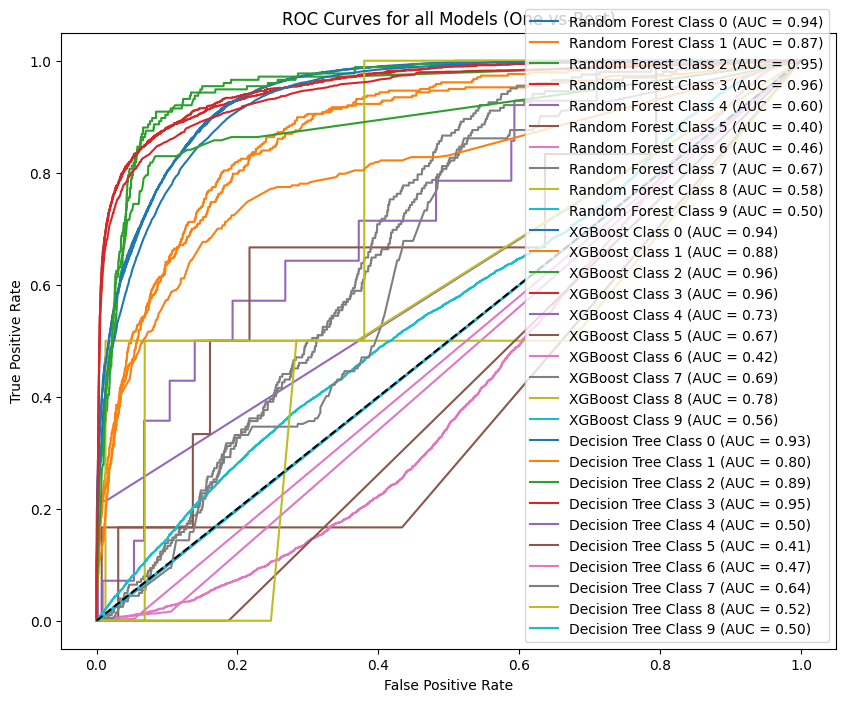

In [ ]:
models = {
    'Random Forest': rf_final,
    'XGBoost': xgb_final,
    'Decision Tree': dt_final
}

plt.figure(figsize=(10, 8))

# Binarize the labels for multiclass ROC curve
y_test_binarized = label_binarize(y_test, classes=np.unique(y_test))
n_classes = y_test_binarized.shape[1]

for model_name, model in models.items():
    if model_name == 'MLP':
      try:
        y_probs = model.predict_proba(X_test)
      except AttributeError:
          print(f"Warning: {model_name} does not have predict_proba. Using decision function instead.")
          y_probs = model.decision_function(X_test)
    else:
        y_probs = model.predict_proba(X_test)

    for i in range(n_classes):
        fpr, tpr, _ = roc_curve(y_test_binarized[:, i], y_probs[:, i])
        roc_auc = roc_auc_score(y_test_binarized[:, i], y_probs[:, i])
        plt.plot(fpr, tpr, label=f'{model_name} Class {i} (AUC = {roc_auc:.2f})')

plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves for all Models (One-vs-Rest)')
plt.legend(loc='lower right')
plt.show()

In [ ]:
shap.initjs()

models = {
    'Random Forest': rf_final,
    'XGBoost': xgb_final,
    'Decision Tree': dt_final,
    'LightGBM': lgbm_model
}

for model_name, model in models.items():
    explainer = shap.TreeExplainer(model)

    # Compute SHAP values (handling potential issues with multi-class outputs)
    shap_values = explainer.shap_values(X_train, check_additivity=False)

    # Convert list output (if multi-class) into a single mean value representation
    if isinstance(shap_values, list):
        shap_values = np.mean(shap_values, axis=0)

    plt.figure(figsize=(8, 6))
    shap.summary_plot(shap_values, X_train, plot_type="bar", show=False)
    plt.title(f'SHAP Summary Plot for {model_name}')
    plt.show()
    plt.close()

NameError: name 'shap' is not defined

In [ ]:
estimators = [
    ('rf', rf_final),
    ('xgb', xgb_final),
    ('dt', dt_final),
    ('lgbm', lgbm_model)
]
meta_learner = XGBClassifier(n_estimators=100, learning_rate=0.05, max_depth=3, random_state=42)

#Stacking Model with Probability Outputs
stacking_model = StackingClassifier(
    estimators=estimators,
    final_estimator=meta_learner,
    passthrough=True
)

# 5-Fold Cross Validation for Robust Performance Measurement
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(stacking_model, X_train, y_train, cv=cv, scoring='accuracy')

print(f"Cross-Validation Accuracy Scores: {cv_scores}")
print(f"Mean CV Accuracy: {np.mean(cv_scores):.4f}")
stacking_model.fit(X_train, y_train)
stacking_preds = stacking_model.predict(X_test)
print("Stacking Accuracy on Test Data:", accuracy_score(y_test, stacking_preds))

In [ ]:
clf = TabNetClassifier(
    n_d=8, n_a=8, n_steps=3, gamma=1.5, lambda_sparse=1e-3,
    optimizer_fn=torch.optim.Adam, optimizer_params=dict(lr=2e-2),
    scheduler_params={"step_size":10, "gamma":0.9}, scheduler_fn=torch.optim.lr_scheduler.StepLR,
    mask_type='sparsemax'
)
clf.fit(
    X_train=X_train, y_train=y_train,
    eval_set=[(X_test, y_test)],
    eval_name=["test"],
    eval_metric=["accuracy"],
    max_epochs=50, patience=10,
    batch_size=128, virtual_batch_size=64
)

In [ ]:
#class probabilities
y_pred_proba = clf.predict_proba(X_test)
y_pred = np.argmax(y_pred_proba, axis=1)
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy: {accuracy:.4f}")

In [ ]:
feature_importances = clf.feature_importances_
feature_df = pd.DataFrame({
    "Feature Index": [f"Feature {i}" for i in range(len(feature_importances))],
    "Importance": feature_importances
})
feature_df = feature_df.sort_values(by="Importance", ascending=False)
fig = px.bar(feature_df,
             x="Feature Index",
             y="Importance",
             title="Feature Importance (TabNet)",
             text_auto=True,
             labels={"Feature Index": "Feature", "Importance": "Importance Score"},
             color="Importance",
             color_continuous_scale="blues")
fig.show()